# Машинное обучение, ФКН ВШЭ

# Практическое задание 10. Обучение без учителя.

## Общая информация
Дата выдачи: 10.04.2023

Мягкий дедлайн: 24.04.2022 23:59 MSK

Жёсткий дедлайн: 30.04.2022 23:59 MSK

## Оценивание и штрафы

Каждая из задач имеет определенную «стоимость» (указана в скобках около задачи). 

Сдавать задание после указанного срока сдачи нельзя.

Задание выполняется самостоятельно. «Похожие» решения считаются плагиатом и все задействованные студенты (в том числе те, у кого списали) не могут получить за него больше 0 баллов (подробнее о плагиате см. на странице курса). Если вы нашли решение какого-то из заданий (или его часть) в открытом источнике, необходимо указать ссылку на этот источник в отдельном блоке в конце вашей работы (скорее всего вы будете не единственным, кто это нашел, поэтому чтобы исключить подозрение в плагиате, необходима ссылка на источник).

Неэффективная реализация кода может негативно отразиться на оценке.

## Формат сдачи
Задания сдаются через систему anytask. Посылка должна содержать:
* Ноутбук homework-practice-10-Username.ipynb

Username — ваша фамилия на латинице

## О задании

В этом задании мы посмотрим на несколько алгоритмов кластеризации и применим их к географическим и текстовым данным. Также мы подробно остановимся на тематическом моделировании текстов, задаче обучения представлений и в каком-то смысле поработаем с semi-supervised learning. 



In [77]:
import pandas as pd
import numpy as np

np.random.seed(0xFFFFFFF)

**Задание 0 (1e-100 балла)**. Опишите свои ощущения от домашки по ЕМ-алгоритму (можно картинкой или мемом).

Вообще все вроде не так плохо оказалось

## Часть 1. Кластеризация автобусных остановок

В этом задании мы сравним разные алгоритмы кластеризации для данных об автобусных остановках Москвы.

**Задание 1.1 (1 балл).** Реализуйте алгоритм спектральной кластеризации, который упоминался на лекции. Для этого разберитесь с кодом шаблона, данного ниже, и допишите недостающую функцию. Напомним, что для графа с матрицей смежности $W = \{w_{ij}\}_{i, j = 1 \dots \ell}$ лапласиан определяется как:

$$
L = D - W,
$$

где $D = \text{diag}(d_1, ..., d_{\ell}), d_i = \sum_{j=1}^{\ell} w_{ij}$.

In [78]:
from sklearn.base import ClusterMixin
from sklearn.cluster import KMeans
from scipy.linalg import eig


class GraphClustering(ClusterMixin):
    def __init__(self, n_clusters=8, n_components=None, **kwargs):
        '''
        Spectral clustering algorithm
        param n_clusters: number of clusters to form
        param n_components: number of eigenvectors to use
        '''

        if n_components is None:
            n_components = n_clusters

        self.n_components = n_components
        self.kmeans = KMeans(n_clusters=n_clusters, **kwargs)

    def fit_predict(self, X, y=None):
        '''
        Perform spectral clustering from graph adjacency matrix
        and return vertex labels.
        param X: (n_samples, n_samples) - graph adjacency matrix
        return: (n_samples, ) - vertex labels
        '''

        eigenvectors = self._generate_eigenvectors(X)
        labels = self.kmeans.fit_predict(eigenvectors[:, 1:])
        return labels

    def _generate_eigenvectors(self, X):
        '''
        Compute eigenvectors for spectral clustering
        param X: (n_samples, n_samples) - graph adjacency matrix
        return: (n_samples, n_components) - eigenvectors
        '''

        L = np.diag(X.sum(1)) - X
        eigenvals, eigenvecs = eig(L, left=False, right=True)
        sort_idx = np.argsort(eigenvals.real)
        return eigenvecs[:, sort_idx][:, :self.n_components].real

Перед тем, как переходить к следующему заданию, протестируйте свое решение.

In [79]:
n_blocks, n_vertices = 10, 1000
block_vertices = n_vertices // n_blocks

X = np.zeros((n_vertices, n_vertices))
for i in range(0, n_vertices, block_vertices):
    X[i:i + block_vertices, i:i + block_vertices] = np.sqrt(i + 1)

graph_clustering = GraphClustering(n_clusters=n_blocks)
labels = graph_clustering.fit_predict(X)

true_labels = np.zeros(n_vertices, dtype=np.int32)
for i in range(0, n_vertices, block_vertices):
    true_labels[i:i + block_vertices] = labels[i]

assert labels.shape == (n_vertices, )
assert np.all(np.bincount(labels) == np.full(n_blocks, block_vertices))
assert np.all(labels == true_labels)

/Users/y.o.aksenov/miniconda3/envs/myenv/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


Теперь можем приступить к работе с реальными данными. Скачайте файл с данными об остановках общественного транспорта **в формате .xlsx** по [ссылке](https://data.mos.ru/opendata/download/60464/1/201) (так гарантированно не возникнет проблем с парсингом файла) и загрузите таблицу в ноутбук. Если вдруг сайт Правительства Москвы сойдет с ума, то возьмите какую-нибудь версию данных [отсюда](https://data.mos.ru/opendata/7704786030-city-surface-public-transport-stops). Для удобства визуализации мы будем работать только с остановками в ЦАО.

In [80]:
!curl https://data.mos.ru/opendata/download/60464/1/201 --output transport.zip

  % Total    % Received % Xferd  Average Speed   Time    Time     Time  Current
                                 Dload  Upload   Total   Spent    Left  Speed
100  730k  100  730k    0     0  2701k      0 --:--:-- --:--:-- --:--:-- 2768k


In [81]:
!unzip transport.zip

Archive:  transport.zip
replace City surface public transport stops.xlsx? [y]es, [n]o, [A]ll, [N]one, [r]ename: ^C


In [82]:
data = pd.read_excel('transport.xlsx')
data = data[data.AdmArea_en == "Czentral`ny'j administrativny'j okrug"]
data = data.reset_index()
data.head()

,index,ID_en,Name_en,Longitude_WGS84_en,Latitude_WGS84_en,Street_en,AdmArea_en,District_en,RouteNumbers_en,StationName_en,Direction_en,Pavilion_en,OperatingOrgName_en,EntryState_en,global_id,geoData
0,278,347,"«2-й Лесной пер.», улица Бутырский Вал (347)",37.586584,55.782106,улица Бутырский Вал,Czentral`ny'j administrativny'j okrug,Tverskoj rajon,АТ18; А12; АТ56; АТ78,2-й Лесной пер.,NaN,да,ГУП «Мосгортранс»,active,889085436,NaN
1,279,349,"«Ул. Сущевский Вал», Новослободская улица (349)",37.590714,55.790630,Новослободская улица,Czentral`ny'j administrativny'j okrug,Tverskoj rajon,АТ47; АМ10; АТ3; АТ56; АТ78,Ул. Сущевский Вал,NaN,да,ГУП «Мосгортранс»,active,889085437,NaN
2,355,479,"«Стадион Лужники (южн.) (пос.)», улица Лужники...",37.565972,55.714265,улица Лужники,Czentral`ny'j administrativny'j okrug,rajon Xamovniki,А64; А216; А809; АС12; А255; АБК; АТ79,Стадион Лужники (южн.) (пос.),NaN,да,ГУП «Мосгортранс»,active,889085549,NaN
3,356,480,"«Спортзал Дружба», Лужнецкая набережная (480)",37.570191,55.712504,Лужнецкая набережная,Czentral`ny'j administrativny'j okrug,rajon Xamovniki,А64; А216; А809; АС12; А255; АБК; АТ79,Спортзал Дружба,NaN,да,ГУП «Мосгортранс»,active,889085550,NaN
4,357,481,"«Лужнецкая наб.», Лужнецкая набережная (481)",37.574559,55.713770,Лужнецкая набережная,Czentral`ny'j administrativny'j okrug,rajon Xamovniki,А64; А216; А809; АС12; А255; АБК; АТ79,Лужнецкая наб.,NaN,да,ГУП «Мосгортранс»,active,889085551,NaN


Воспользуемся библиотекой `folium` для визуализации данных.

In [ ]:
import folium

map = folium.Map([55.75215, 37.61819], zoom_start=12)
for id, row in data.iterrows():
    folium.Circle([row.Latitude_WGS84_en, row.Longitude_WGS84_en],
                  radius=10).add_to(map)
map

**Задание 1.2 (1 балл).** Попробуем построить граф, в котором вершинами будут остановки. Как вы уже могли заметить, для каждой остановки указаны номера маршрутов, проходящих через неё. Логично соединить ребрами соседние остановки каждого маршрута. Однако мы не знаем, в каком порядке автобусы объезжают остановки. Но мы можем применить эвристический алгоритм, который восстановит нам порядок маршрутов:

* Для каждого маршрута выделим список всех остановок, через которые он проходит.
* Выберем начальную остановку маршрута как точку, наиболее удаленную от всех остальных остановок этого маршрута.
* Каждую следующую точку маршрута будем выбирать как самую близкую из оставшихся точек (не включенных в маршрут ранее).

Фактически, у нас получается жадное решение задачи коммивояжера. Когда мы отсортировали маршруты, можем построить по ним граф. Будем строить его по таким правилам:

* Между двумя остановками будет ребро, если они являются соседними хотя бы на одном маршруте. Вес ребра равен числу маршрутов, на которых остановки являются соседними.
* В графе не будет петель (то есть у матрицы смежности будет нулевая диагональ).

Реализуйте предложенный способ построения графа. Для этого рекомендуется воспользоваться шаблонами, приведенными ниже.

In [ ]:
from scipy.spatial.distance import cdist


def get_routes(data):
    '''
    Accumulate routes from raw data
    param data: pd.DataFrame - public transport stops data
    return: dict - unsorted stops ids for each route,
                   e.g. routes['A1'] = [356, 641, 190]
    '''
    data['numbers_list'] = data['RouteNumbers_en'].str.split(';').apply(lambda x: [i.strip() for i in x])
    data['id'] = data.index
    routes = data.explode('numbers_list').groupby('numbers_list')['id'].agg(list)
    routes = dict(zip(routes.index, routes.values))
    return routes


def sort_routes(data, routes):
    '''
    Sort routes according to the proposed algorithm
    param data: pd.DataFrame - public transport stops data
    param routes: dict - unsorted stops ids for each route
    return: dict - sorted stops ids for each route
    '''
    sorted_routes = {}
    for num in routes.keys():
        sorted_stops = []
        used_stops = set()

        route_stops_df = data.loc[routes[num], ['Latitude_WGS84_en', 'Longitude_WGS84_en']]
        distances = cdist(route_stops_df, route_stops_df, metric='euclidean')

        best_stop_idx = np.argmax(distances.sum(0))
        sorted_stops.append(routes[num][best_stop_idx])
        used_stops.add(best_stop_idx)

        while len(sorted_stops) != len(routes[num]):
            nearest_stop_dist = 1e6
            nearest_stop = 1e6
            for i in range(distances.shape[0]):
                if distances[best_stop_idx, i] < nearest_stop_dist and i not in used_stops:
                    nearest_stop_dist = distances[best_stop_idx, i]
                    nearest_stop = i
            best_stop_idx = nearest_stop
            sorted_stops.append(routes[num][best_stop_idx])
            used_stops.add(best_stop_idx)
        sorted_routes[num] = sorted_stops
    
    return sorted_routes


def get_adjacency_matrix(data, sorted_routes):
    '''
    Compute adjacency matrix for sorted routes
    param data: pd.DataFrame - public transport stops data
    param sorted_routes: dict - sorted stops ids for each route
    return: (n_samples, n_samples) - graph adjacency matrix
    '''
    adj_mat = np.zeros((data.shape[0], data.shape[0]))
    for num in sorted_routes.keys():
        for i in range(len(sorted_routes[num]) - 1):
            adj_mat[sorted_routes[num][i], sorted_routes[num][i + 1]] += 1
            adj_mat[sorted_routes[num][i + 1], sorted_routes[num][i]] += 1
    return adj_mat

In [ ]:
routes = get_routes(data)
sorted_routes = sort_routes(data, routes)
adjacency_matrix = get_adjacency_matrix(data, sorted_routes)

Проверим, что маршруты получились адекватными. Для этого нарисуем их на карте.

In [ ]:
map = folium.Map([55.75215, 37.61819], zoom_start=12)
for route_id in np.random.choice(list(sorted_routes.keys()), size=5):
    coords = data.loc[
        sorted_routes[route_id],
        ['Latitude_WGS84_en', 'Longitude_WGS84_en']
    ].values.tolist()
    folium.vector_layers.PolyLine(coords).add_to(map)

map

**Задание 1.3 (0 баллов)**. Реализуйте функцию `draw_clustered_map`, которая рисует карту центра Москвы с кластерами остановок, раскрашенными в разные цвета.

In [ ]:
import random

marker_colors = []
for i in range(100):
    color = random.randrange(0, 2**24)
    hex_color = hex(color)
    marker_colors.append(f'#{hex_color[2:].zfill(6)[::-1]}')
    
marker_colors.append('black')

In [ ]:
def draw_clustered_map(data, labels):
    '''
    Create map with coloured clusters
    param data: pd.DataFrame - public transport stops data
    param labels: (n_samples, ) - cluster labels for each stop
    return: folium.Map - map with coloured clusters
    '''
    map = folium.Map([55.75215, 37.61819], zoom_start=12)
    for id, row in data.iterrows():
        folium.Circle([row.Latitude_WGS84_en, row.Longitude_WGS84_en],
                    radius=10, color=marker_colors[labels[id]]).add_to(map)
    return map

**Задание 1.4 (1.5 балла)**. Примените алгоритмы кластеризации K-Means и DBSCAN из `sklearn` на координатах остановок, а также свою реализацию спектральной кластеризации на построенной выше матрице смежности. Визуализируйте результат кластеризации с помощью функции `draw_clustered_map`. Подберите параметры алгоритмов (`n_clusters` у K-Means, `eps` у DBSCAN, `n_clusters` и `n_components` у спектральной кластеризации) так, чтобы получить наиболее характерный для этих алгоритмов результат кластеризации (можете поэкспериментировать и оставить в ноутбуке картинки только для итоговых значений параметров, также обратите внимание на баланс объектов в кластерах). Не забудьте, что DBSCAN помечает некоторые точки как шумовые (можно раскрасить их в отдельный цвет).

In [ ]:
from sklearn.cluster import KMeans, DBSCAN

In [ ]:
kmeans = KMeans(n_clusters=8, n_init=10).fit(data[['Longitude_WGS84_en', 'Latitude_WGS84_en']])
draw_clustered_map(data, kmeans.labels_)

In [ ]:
dbscan = DBSCAN(eps=0.0037).fit(data[['Longitude_WGS84_en', 'Latitude_WGS84_en']])
draw_clustered_map(data, dbscan.labels_)

In [ ]:
routes = get_routes(data)
sorted_routes = sort_routes(data, routes)
adjacency_matrix = get_adjacency_matrix(data, sorted_routes)

In [ ]:
graph_clustering = GraphClustering(n_clusters=40, n_components=10)
graph_clustering_labels = graph_clustering.fit_predict(adjacency_matrix)
draw_clustered_map(data, graph_clustering_labels)

Проинтерпретируйте полученные результаты. Чем отличаются разбиения на кластеры, получаемые разными алгоритмами? Какие плюсы и минусы есть у каждого алгоритма? Какой алгоритм кажется вам наиболее подходящим для кластеризации остановок?

**Ответ:**

K-means разделяет на непересекающиеся кластеры примерно выпуклой формы, DBSCAN очень нежно реагирует на подбор гиперпараметра epsilon и при неверном вообще не может ничего кластеризировать, но при этом делает разбиения на кластеры сложной формы. Спектральная кластеризация смогла точнее описать зоны маршрутного транспорта москвы, при этом при кластеризации учитывались формы дорог. Мне кажется спектральная сработала лучше всего


## Часть 2. Тематическое моделирование текстов

В этой части мы познакомимся с одной из самых популярных задач обучения без учителя &mdash; с задачей тематического моделирования текстов. Допустим, нам доступна некоторая коллекция документов без разметки, и мы хотим автоматически выделить несколько тем, которые встречаются в документах, а также присвоить каждому документу одну (или несколько) тем. Фактически, мы будем решать задачу, похожую на кластеризацию текстов: отличие в том, что нас будет интересовать не только разбиение текстов на группы, но и выделение ключевых слов, определяющих каждую тему.

Мы будем работать с новостными статьями BBC за 2004-2005 годы. Скачайте данные по [ссылке](https://www.kaggle.com/hgultekin/bbcnewsarchive).

In [ ]:
data = pd.read_csv('bbc-news-data.csv', sep='\t')
data.sample(5)

,category,filename,title,content
1289,politics,394.txt,Economy focus for election battle,Britain's economic future will be at the hear...
1872,tech,049.txt,Domain system scam fear,A system to make it easier to create website ...
1044,politics,149.txt,Blair returns from peace mission,Prime Minister Tony Blair has arrived back fr...
654,entertainment,145.txt,Sir Paul rocks Super Bowl crowds,Sir Paul McCartney wowed fans with a live min...
134,business,135.txt,Feta cheese battle reaches court,A row over whether only Greece should be allo...


Как вы могли заметить, данные уже содержат разметку по тематике (колонка category). В этой части мы забудем, что она есть, и будем работать только с текстовыми данными. Проведем предобработку текста, состоящую из следующих пунктов:

* Объединим заголовок и содержание статьи в одно поле.
* Приведем текст к нижнему регистру, разобьем его на токены.
* Оставим только буквенные слова (удалив, таким образом, пунктуацию и числа).
* Применим лемматизацию.
* Удалим стоп-слова.


In [ ]:
import nltk
from nltk.corpus import stopwords
from nltk.tokenize import word_tokenize
from nltk.stem import WordNetLemmatizer

In [ ]:
nltk.download('omw-1.4')

[nltk_data] Downloading package omw-1.4 to
[nltk_data]     /Users/y.o.aksenov/nltk_data...


True

In [ ]:
nltk.download('punkt')
nltk.download('wordnet')
nltk.download('stopwords')

stop_words = set(stopwords.words('english') + ['ha', 'wa', 'say', 'said'])
lemmatizer = WordNetLemmatizer()

[nltk_data] Downloading package punkt to
[nltk_data]     /Users/y.o.aksenov/nltk_data...
[nltk_data]   Unzipping tokenizers/punkt.zip.
[nltk_data] Downloading package wordnet to
[nltk_data]     /Users/y.o.aksenov/nltk_data...
[nltk_data] Downloading package stopwords to
[nltk_data]     /Users/y.o.aksenov/nltk_data...
[nltk_data]   Unzipping corpora/stopwords.zip.


In [ ]:
def preprocess(text):
    text = list(filter(str.isalpha, word_tokenize(text.lower())))
    text = list(lemmatizer.lemmatize(word) for word in text)
    text = list(word for word in text if word not in stop_words)
    return ' '.join(text)

In [ ]:
data['raw_text'] = data.apply(lambda row: row.title + row.content, axis=1)
data['text'] = data.apply(lambda row: preprocess(row.raw_text), axis=1)

Для визуализации частот слов в текстах мы будем использовать [облака тегов](https://en.wikipedia.org/wiki/Tag_cloud).

In [ ]:
from wordcloud import WordCloud

def draw_wordcloud(texts, max_words=1000, width=1000, height=500):
    wordcloud = WordCloud(background_color='white', max_words=max_words,
                          width=width, height=height)
    
    joint_texts = ' '.join(list(texts))
    wordcloud.generate(joint_texts)
    return wordcloud.to_image()

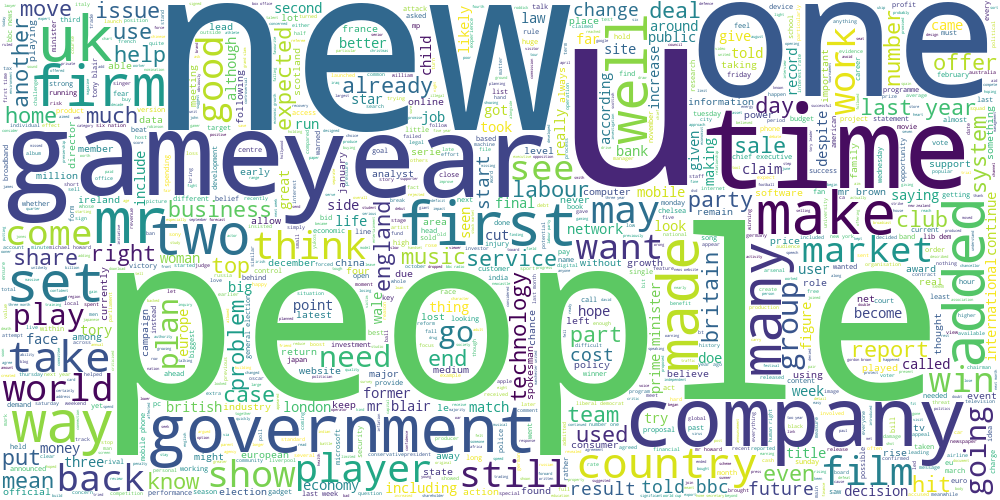

In [ ]:
draw_wordcloud(data.text)

**Задание 2.1 (1 балл).** Обучите алгоритм K-Means на tf-idf представлениях текстов. При обучении tf-idf векторайзера рекомендуется отбрасывать редко встречающиеся слова, а также воздержитесь от использования N-грамм. Возьмите не очень большое число кластеров, чтобы было удобно интерпретировать получившиеся темы (например, `n_clusters` = 8). Постройте облака тегов для текстов из разных кластеров. Получились ли темы интерпретируемыми? Попробуйте озаглавить каждую тему.

**Ответ:**

In [ ]:
from sklearn.feature_extraction.text import TfidfVectorizer

In [ ]:
vectorizer = TfidfVectorizer(max_df=0.9)
vectorized_texts = vectorizer.fit_transform(data['text'])

In [ ]:
kmeans = KMeans(n_clusters=8).fit(vectorized_texts)

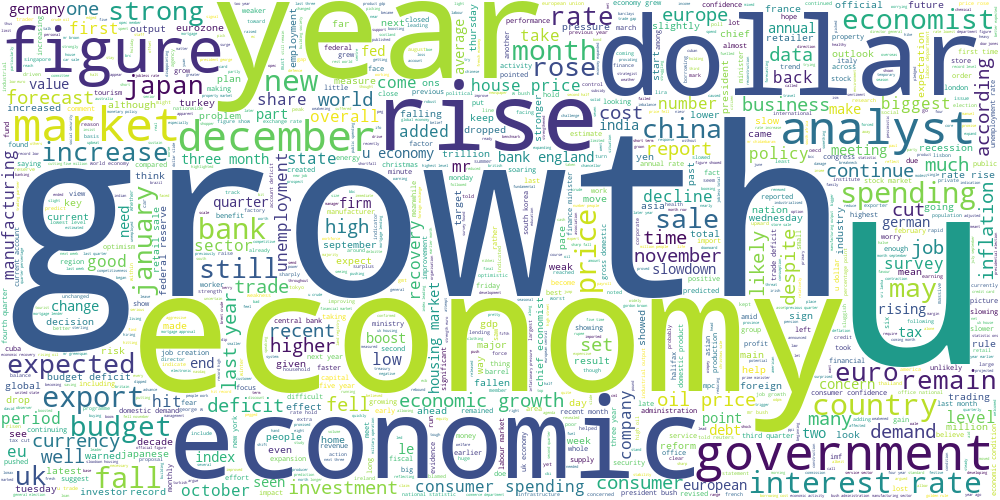

In [ ]:
draw_wordcloud(data[kmeans.labels_ == 0].text)

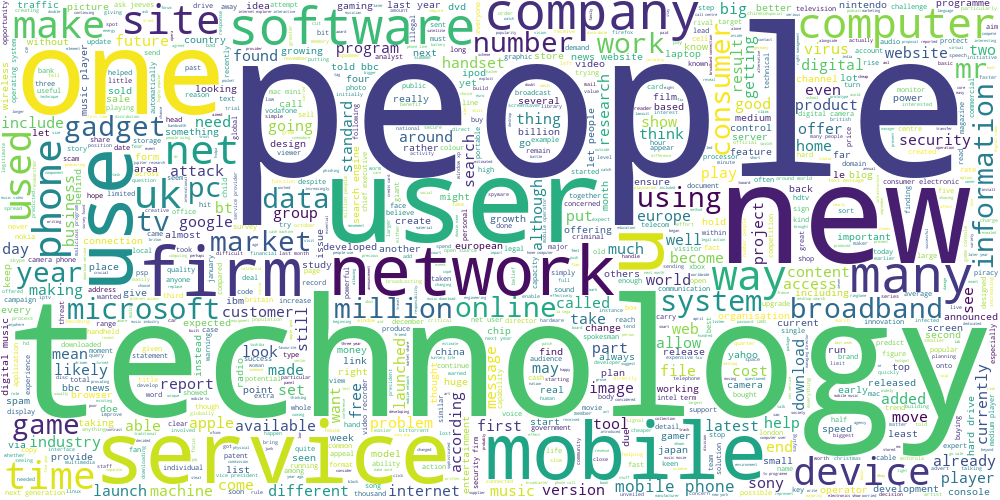

In [ ]:
draw_wordcloud(data[kmeans.labels_ == 1].text)

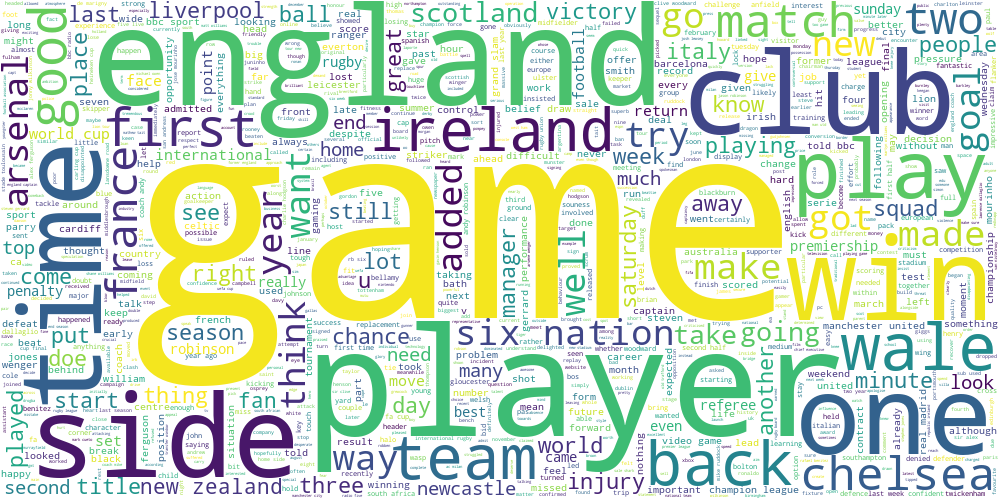

In [ ]:
draw_wordcloud(data[kmeans.labels_ == 2].text)

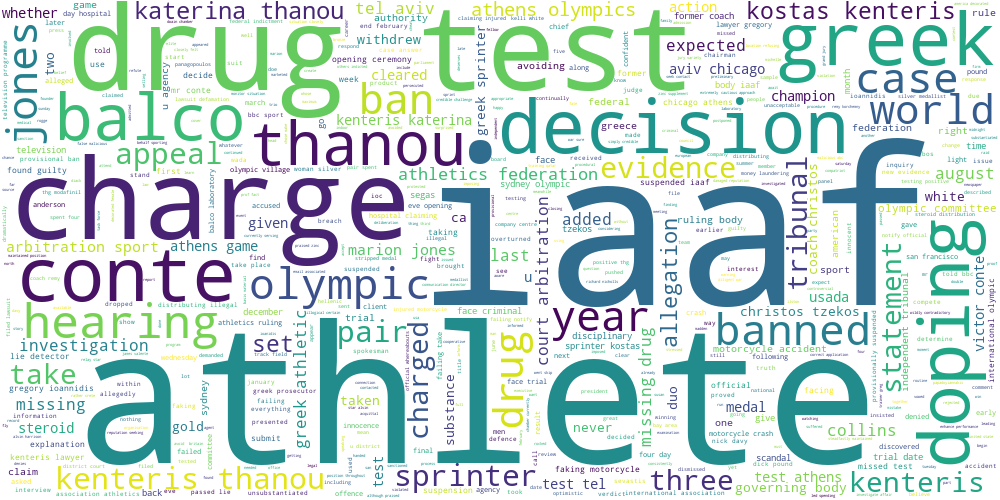

In [ ]:
draw_wordcloud(data[kmeans.labels_ == 3].text)

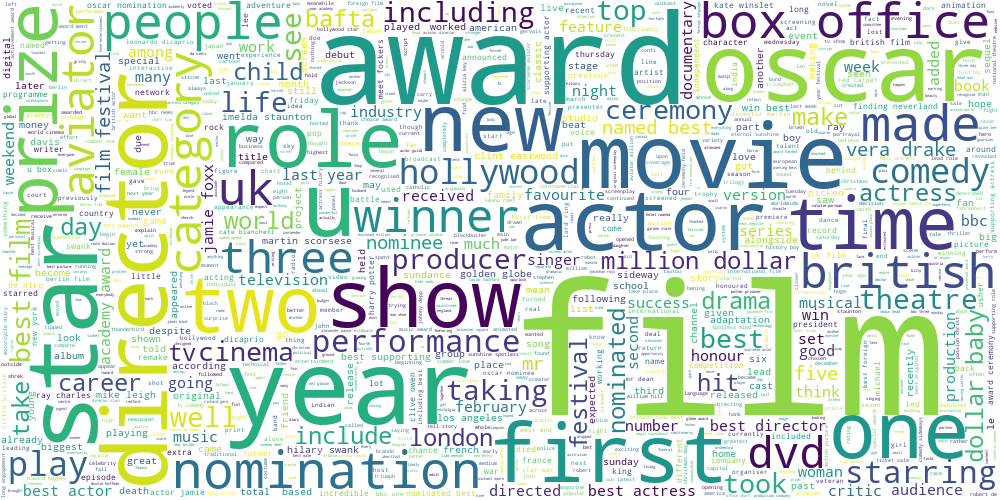

In [ ]:
draw_wordcloud(data[kmeans.labels_ == 4].text)

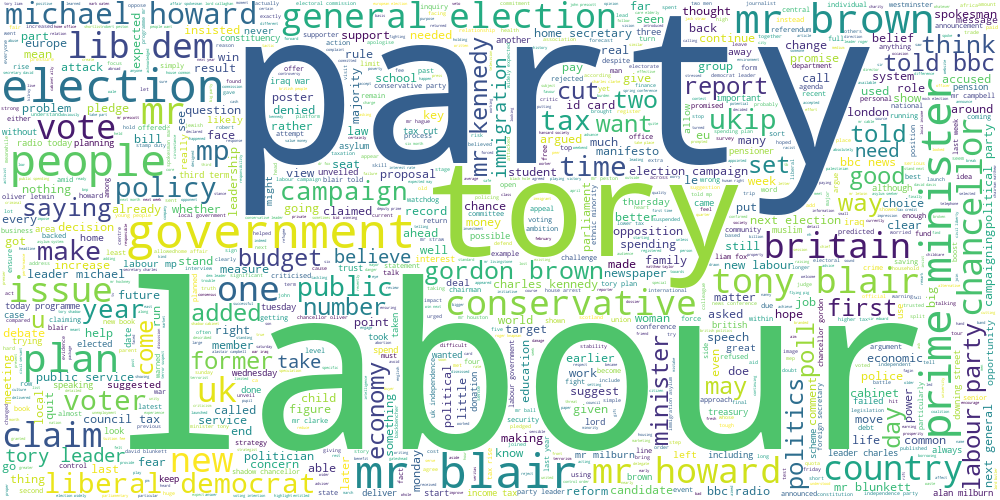

In [ ]:
draw_wordcloud(data[kmeans.labels_ == 5].text)

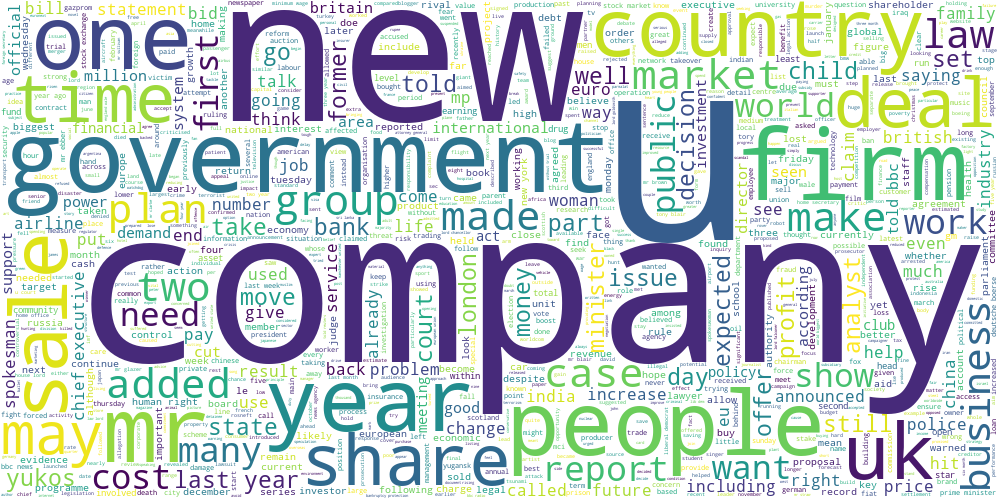

In [ ]:
draw_wordcloud(data[kmeans.labels_ == 6].text)

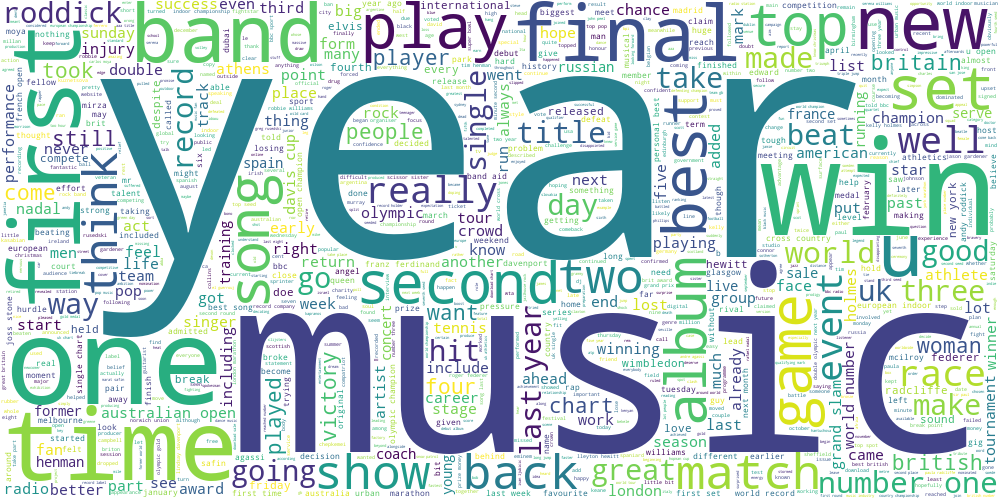

In [ ]:
draw_wordcloud(data[kmeans.labels_ == 7].text)

Можно разделить на темы:
0 - экономика
1 - технологии
2 - футбол
3 - спорт
4 - кино
5 - политика
6 - бизнес
7 - музыка

**Задание 2.2 (0.5 балла).** Попробуем другой способ выделить ключевые слова для каждой темы. Помимо непосредственного разбиения объектов алгоритм K-Means получает центр каждого кластера. Попробуйте взять центры кластеров и посмотреть на слова, для которых значения соответствующих им признаков максимальны. Согласуются ли полученные слова с облаками тегов из прошлого задания?

**Ответ:**

In [ ]:
idx_to_word = vectorizer.get_feature_names_out()

for i, vec in enumerate(kmeans.cluster_centers_):
    print(i, ' '.join(idx_to_word[np.argsort(vec)[::-1][:20]]))

0 economy growth rate economic price dollar figure deficit year rise spending bank economist market export quarter consumer month budget oil
1 mobile phone technology people user service software music digital computer net broadband site microsoft network device system pc firm use
2 game england player club side wale chelsea rugby ireland team cup win league play coach match six arsenal injury goal
3 kenteris iaaf thanou greek test drug conte balco athens sprinter athlete olympics doping athletics tribunal olympic federation charge tzekos missing
4 film award best oscar actor star festival actress director nomination movie comedy aviator year box role category prize starring hollywood
5 mr labour election party blair tory brown tax howard would minister government prime chancellor conservative leader plan lib campaign people
6 mr company firm year government would share sale new law country bank profit also market deal lord could people minister
7 band world open champion year chart al

Слова согласуются с облаками тегов

**Задание 2.3 (1.5 балла).** В первой части мы сравнили три разных алгоритма кластеризации на географических данных. Проделаем то же самое для текстовых данных (в качестве признакого описания снова используем tf-idf). Получите три разбиения на кластеры с помощью алгоритмов K-Means, DBSCAN и спектральной кластеризации (на этот раз воспользуйтесь реализацией из `sklearn`). Для K-Means и спектральной кластеризации возьмите одинаковое небольшое число кластеров, подберите параметр `eps` метода DBSCAN так, чтобы получить приблизительно такое же число кластеров.

Далее, обучите двухмерные t-SNE представления над tf-idf признаками текстов. Визуализируйте эти представления для каждого алгоритма, раскрасив каждый кластер своим цветом. Лучше всего расположить визуализации на одном графике на трех разных сабплотах. Не забудьте, что DBSCAN помечает некоторые точки как шумовые (можно раскрасить их в отдельный цвет).

In [ ]:
for eps in np.linspace(0.88, 1.29, 60):
    dbscan = DBSCAN(eps=eps).fit(vectorized_texts)
    n_clusters_ = len(set(dbscan.labels_)) - (1 if -1 in dbscan.labels_ else 0)
    print(n_clusters_, eps)

8 0.88
9 0.8869491525423728
9 0.8938983050847458
9 0.9008474576271186
9 0.9077966101694915
9 0.9147457627118644
10 0.9216949152542373
10 0.9286440677966101
12 0.9355932203389831
12 0.9425423728813559
12 0.9494915254237288
13 0.9564406779661017
15 0.9633898305084746
16 0.9703389830508474
17 0.9772881355932204
18 0.9842372881355932
22 0.9911864406779661
23 0.998135593220339
27 1.005084745762712
29 1.0120338983050847
33 1.0189830508474575
34 1.0259322033898306
35 1.0328813559322034
35 1.0398305084745763
33 1.046779661016949
33 1.0537288135593221
33 1.060677966101695
34 1.0676271186440678
36 1.0745762711864406
39 1.0815254237288137
42 1.0884745762711865
42 1.0954237288135593
44 1.1023728813559321
53 1.1093220338983052
54 1.116271186440678
51 1.1232203389830508
59 1.1301694915254237
61 1.1371186440677965
62 1.1440677966101696
59 1.1510169491525424
58 1.1579661016949152
57 1.1649152542372883
58 1.171864406779661
49 1.178813559322034
44 1.1857627118644067
37 1.1927118644067796
35 1.1996610169

In [ ]:
dbscan = DBSCAN(eps=1.2552542372881357).fit(vectorized_texts)
n_clusters_ = len(set(dbscan.labels_)) - (1 if -1 in dbscan.labels_ else 0)
print(n_clusters_)

8


Возьмем eps = 0.88

In [ ]:
kmeans = KMeans(n_clusters=8).fit(vectorized_texts)

In [ ]:
from sklearn.cluster import SpectralClustering
from sklearn.manifold import TSNE

In [ ]:
spectral = SpectralClustering(n_clusters=8).fit(vectorized_texts)

In [ ]:
repr_2d = TSNE(n_components=2, learning_rate='auto', init='random').fit_transform(vectorized_texts)

In [ ]:
marker_colors = np.array(marker_colors)

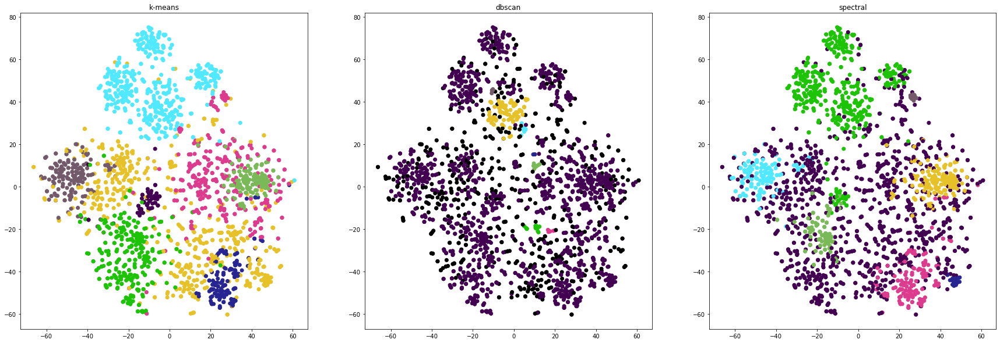

In [ ]:
import matplotlib.pyplot as plt
fig = plt.figure(figsize=(30, 10))

ax1 = fig.add_subplot(131)
ax2 = fig.add_subplot(132)
ax3 = fig.add_subplot(133)

ax1.set_title('k-means')
ax2.set_title('dbscan')
ax3.set_title('spectral')

ax1.scatter(x=repr_2d[:, 0], y=repr_2d[:, 1], color=marker_colors[kmeans.labels_])
ax2.scatter(x=repr_2d[:, 0], y=repr_2d[:, 1], color=marker_colors[dbscan.labels_])
ax3.scatter(x=repr_2d[:, 0], y=repr_2d[:, 1], color=marker_colors[spectral.labels_])

plt.show()

Прокомментируйте получившиеся результаты. Какой баланс кластеров получился у разных методов? Соотносятся ли визуализации для текстов с визуализациями для географических данных?

**Ответ:**

1. С таким же числом кластеров dbscan сработал плохо, почти все занимает фиолетовый кластер, а остальные очень маленькие
2. k-means сработал отлично, кластеры примерно одинаковых размеров, но есть и небольшие, имеют адекватное расположение и сильно не разбросаны
3. Спектральная кластеризация похуже, но адекватнее dbscan (при этом фиолетовый кластер получился каким-то шумовым и он раскидан повсюду)

Визуализации в принципе соотносятся с теми, которые получались на географических данных (k-means делает выпуклые по форме кластеры, а спектральная находит даже смешанные кластеры), только там я подбирал eps для dbscan, чтобы получить адекватную кластеризацию, а тут по заданию нужно было примерно такое же число кластеров, то есть 8, при которой получилось не очень

**Задание 2.4 (1.5 балла).** Обучите модель латентного размещения Дирихле. Не забудьте, что она работает с мешком слов, а не с tf-idf признаками. Придумайте, как превратить распределение тем для текста в номер его кластера. Возьмите параметр `n_components` в 2-3 раза больше, чем число кластеров для K-Means. Получились ли темы более узкими от такого нововведения? Постройте облака тегов для нескольких наиболее удачных тем.

**Ответ:**

In [ ]:
from sklearn.decomposition import LatentDirichletAllocation
from sklearn.feature_extraction.text import CountVectorizer

In [ ]:
bag_of_words = CountVectorizer().fit_transform(data['text'])

In [ ]:
lda = LatentDirichletAllocation(n_components=16).fit(bag_of_words)

In [ ]:
lda_labels = lda.transform(bag_of_words).argmax(axis=1)

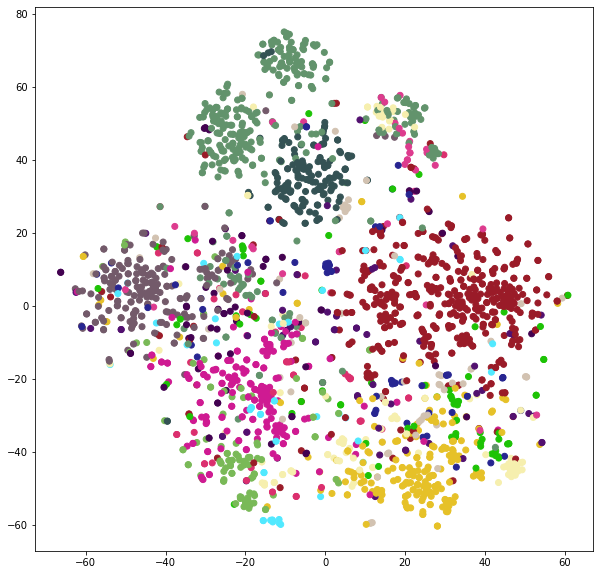

In [ ]:
fig = plt.figure(figsize=(10, 10))
plt.scatter(x=repr_2d[:, 0], y=repr_2d[:, 1], color=marker_colors[lda_labels])
plt.show()

In [ ]:
from collections import Counter

for i in range(16):
    print(Counter(" ".join(data.loc[lda_labels == i, 'text']).split()).most_common(20))

[('music', 175), ('people', 153), ('also', 83), ('show', 82), ('one', 74), ('industry', 73), ('year', 72), ('would', 71), ('company', 63), ('wage', 62), ('new', 61), ('time', 60), ('uk', 56), ('business', 56), ('mr', 53), ('last', 52), ('get', 51), ('minimum', 49), ('game', 49), ('make', 47)]
[('year', 122), ('oil', 93), ('mr', 79), ('company', 74), ('u', 72), ('india', 72), ('firm', 67), ('also', 63), ('new', 62), ('would', 61), ('government', 60), ('budget', 59), ('country', 52), ('deal', 52), ('price', 49), ('one', 45), ('two', 44), ('could', 43), ('spending', 42), ('share', 42)]
[('drug', 35), ('year', 32), ('world', 32), ('v', 31), ('u', 29), ('also', 28), ('balco', 24), ('collins', 22), ('sprinter', 21), ('european', 20), ('would', 20), ('company', 20), ('athlete', 20), ('case', 18), ('ireland', 17), ('last', 15), ('take', 15), ('two', 15), ('argentina', 15), ('champion', 15)]
[('people', 103), ('blog', 99), ('mobile', 90), ('mr', 87), ('phone', 72), ('year', 69), ('game', 58), (

Темы получились в принципе такие же, те которые новые практически совпадают, но вот например появились два разных кластера касаемо технологий (4 и 12)

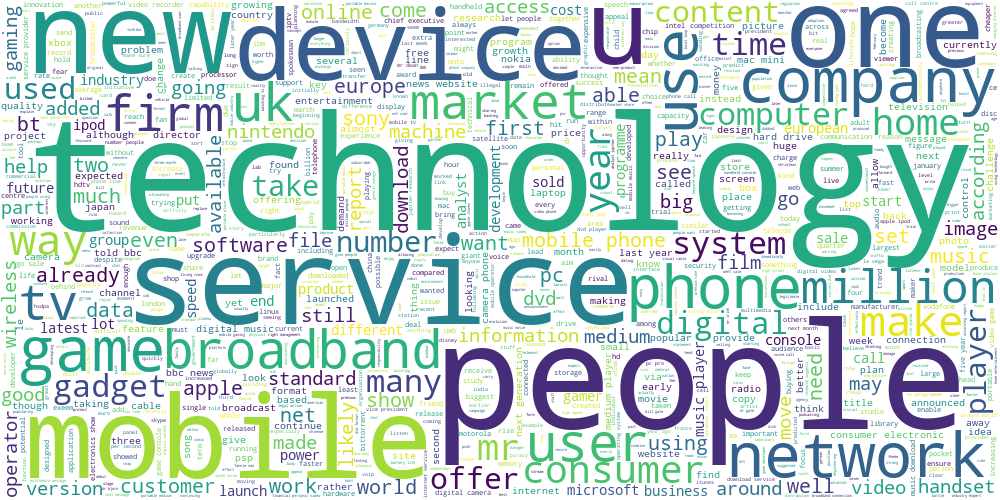

In [ ]:
draw_wordcloud(data.loc[lda_labels == 12, 'text'])

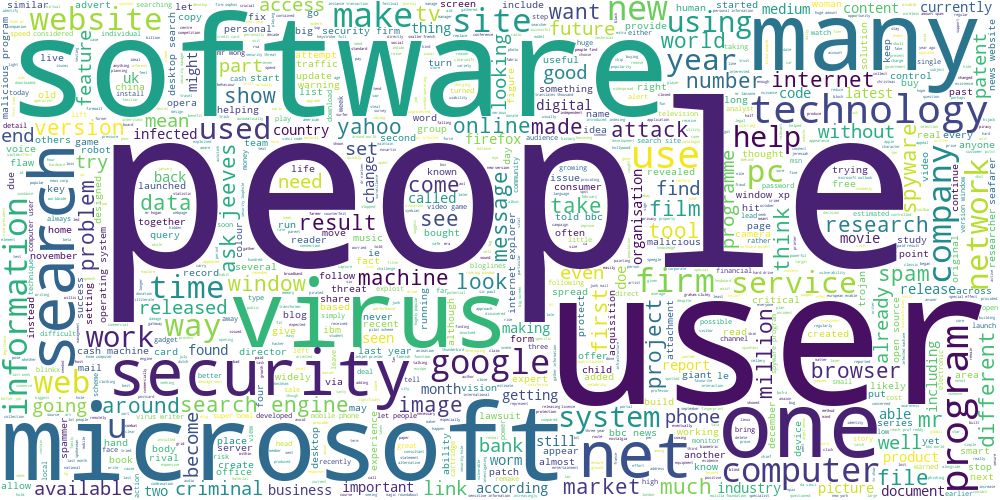

In [ ]:
draw_wordcloud(data.loc[lda_labels == 4, 'text'])

Еще касаемо рынка и экономики

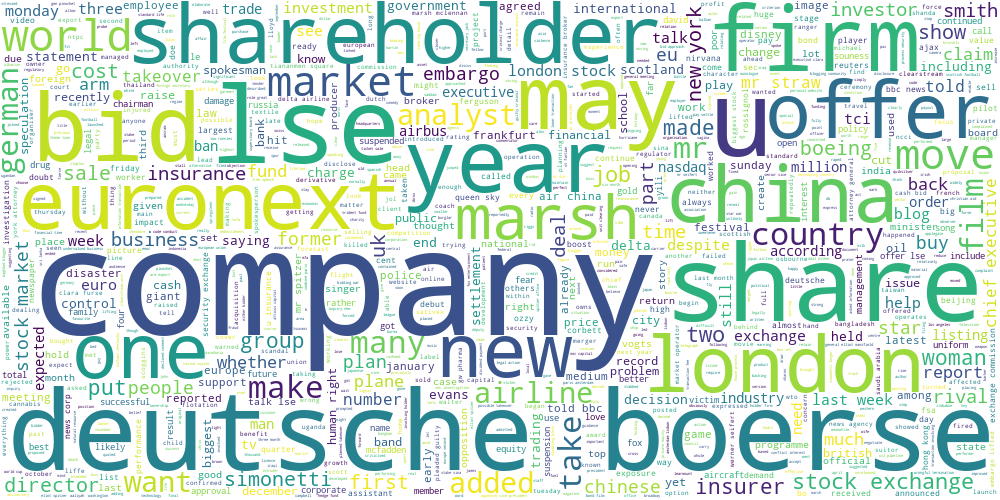

In [ ]:
draw_wordcloud(data.loc[lda_labels == 5, 'text'])

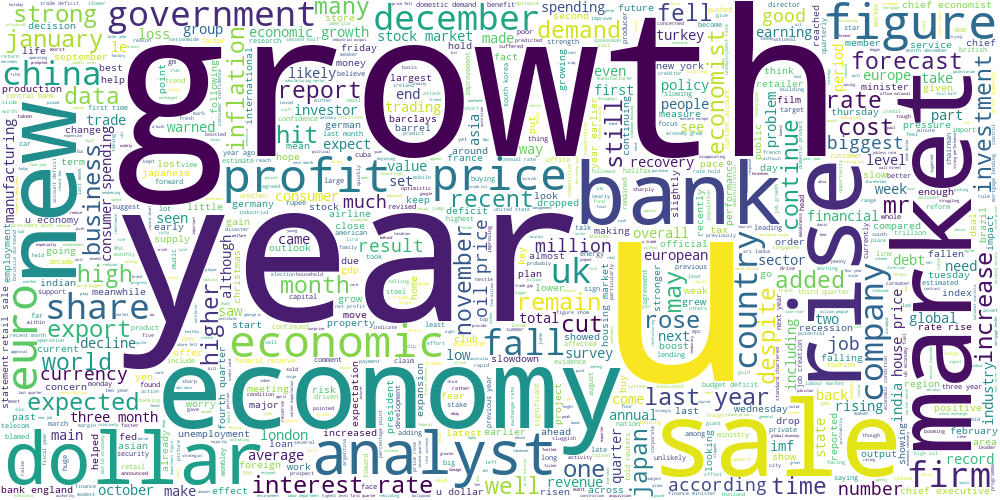

In [ ]:
draw_wordcloud(data.loc[lda_labels == 6, 'text'])

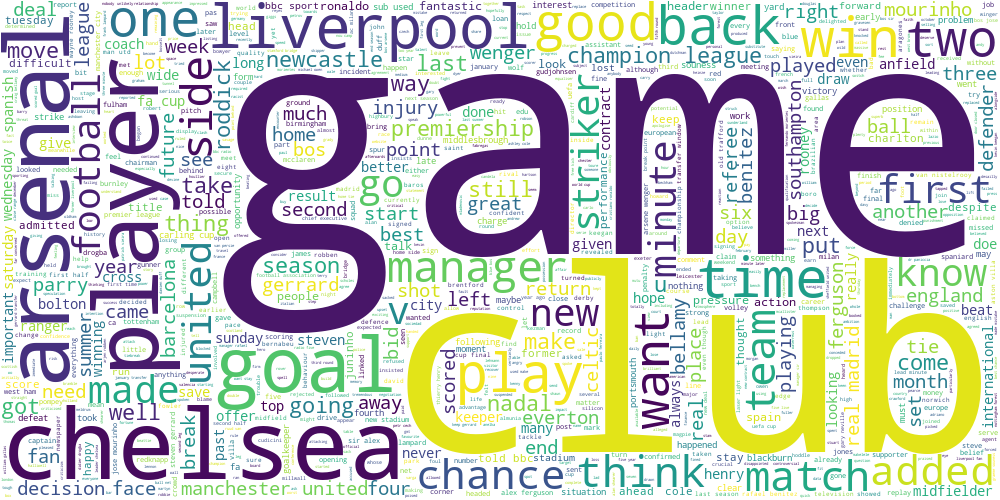

In [ ]:
draw_wordcloud(data.loc[lda_labels == 15, 'text'])

## Часть 3. Transfer learning для задачи классификации текстов

**Задание 3.1 (0.5 балла).** Вспомним, что у нас есть разметка для тематик статей. Попробуем обучить классификатор поверх unsupervised-представлений для текстов. Рассмотрите три модели:

* Логистическая регрессия на tf-idf признаках
* K-Means на tf-idf признаках + логистическая регрессия на расстояниях до центров кластеров
* Латентное размещение Дирихле + логистическая регрессия на вероятностях тем

Разделите выборку на обучающую и тестовую, замерьте accuracy на обоих выборках для всех трех моделей. Параметры всех моделей возьмите равными значениям по умолчанию.

In [ ]:
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import accuracy_score

In [ ]:
train_X, test_X, train_y, test_y = train_test_split(data['text'], data['category'], test_size=0.3)

In [ ]:
vectorizer = TfidfVectorizer()
vectorized_train_X = vectorizer.fit_transform(train_X)
vectorized_test_X = vectorizer.transform(test_X)

In [ ]:
logreg = LogisticRegression()
logreg.fit(vectorized_train_X, train_y)
y_train_pred = logreg.predict(vectorized_train_X)
y_test_pred = logreg.predict(vectorized_test_X)

In [ ]:
print('LogReg train accuracy:', accuracy_score(y_train_pred, train_y))
print('LogReg test accuracy:', accuracy_score(y_test_pred, test_y))

LogReg train accuracy: 0.9967886962106616
LogReg test accuracy: 0.9715568862275449


In [ ]:
kmeans = KMeans()
y_train_dist = kmeans.fit_transform(vectorized_train_X)
y_test_dist = kmeans.transform(vectorized_test_X)
kmeans_logreg = LogisticRegression()
kmeans_logreg.fit(y_train_dist, train_y)
print('KMeans Logreg train accuracy:', accuracy_score(kmeans_logreg.predict(y_train_dist), train_y))
print('KMeans Logreg test accuracy:', accuracy_score(kmeans_logreg.predict(y_test_dist), test_y))

KMeans Logreg train accuracy: 0.8041104688503532
KMeans Logreg test accuracy: 0.7994011976047904


In [ ]:
bow_vectorizer = CountVectorizer()
train_bag_of_words = bow_vectorizer.fit_transform(train_X)
test_bag_of_words = bow_vectorizer.transform(test_X)

In [ ]:
lda = LatentDirichletAllocation()
lda_train_probs = lda.fit_transform(train_bag_of_words)
lda_test_probs = lda.transform(test_bag_of_words)

lda_logreg = LogisticRegression()
lda_logreg.fit(lda_train_probs, train_y)
print('LDA Logreg train accuracy:', accuracy_score(lda_logreg.predict(lda_train_probs), train_y))
print('LDA Logreg test accuracy:', accuracy_score(lda_logreg.predict(lda_test_probs), test_y))


LDA Logreg train accuracy: 0.9023763648041104
LDA Logreg test accuracy: 0.9311377245508982


У какой модели получилось лучшее качество? С чем это связано?

**Ответ:**

Наилучшее качество получилось у логистической регрессии, связано с тем, что дефолтные параметры кластеризации не обязательно совпадают с количеством классов, поэтому полученные вероятности и расстояния не соответствуют истинным расстояниям до классов

**Задание 3.2 (1.5 балла).** Теперь просимулируем ситуацию слабой разметки, которая часто встречается в реальных данных. Разделим обучающую выборку в пропорции 5:65:30. Будем называть части, соответственно, размеченный трейн, неразмеченный трейн и валидация.

Все unsupervised-алгоритмы (векторайзеры и алгоритмы кластеризации) запускайте на всем трейне целиком (размеченном и неразмеченном, суммарно 70%), а итоговый классификатор обучайте только на размеченном трейне (5%). Подберите гиперпараметры моделей по качеству на валидации (30%), а затем оцените качество на тестовой выборке (которая осталась от прошлого задания). Не скромничайте при подборе числа кластеров, сейчас нас интересует не интерпретируемое разбиение выборки, а итоговое качество классификации. 

In [ ]:
lil_train_X, val_X, lil_train_y, val_y = train_test_split(train_X, train_y, test_size=0.3)

In [ ]:
lil_train_X.shape, val_X.shape

((1089,), (468,))

In [ ]:
unlabeled_X, labeled_X, unlabeled_y, labeled_y = train_test_split(lil_train_X, lil_train_y, test_size=5/70)

In [ ]:
unlabeled_X.shape, labeled_X.shape

((1011,), (78,))

In [ ]:
vectorizer = TfidfVectorizer()
vec_lil_train_X = vectorizer.fit_transform(lil_train_X)
vec_labeled_X = vectorizer.transform(labeled_X)
vec_unlabeled_X = vectorizer.transform(unlabeled_X)
vec_test_X = vectorizer.transform(test_X)
vec_val_X = vectorizer.transform(val_X)

In [ ]:
import optuna

In [ ]:
def objective(trial):
    logreg = LogisticRegression(C=trial.suggest_float("C", 0, 5))
    logreg.fit(vec_labeled_X, labeled_y)
    return accuracy_score(logreg.predict(vec_val_X), val_y)

study = optuna.create_study(direction=optuna.study.StudyDirection.MAXIMIZE)
study.optimize(objective, n_trials=100, show_progress_bar=False)

[I 2023-04-22 16:00:33,990] A new study created in memory with name: no-name-7ff2e26d-7026-43a3-8e60-8cf1c7605ea1
[I 2023-04-22 16:00:34,551] Trial 0 finished with value: 0.7970085470085471 and parameters: {'C': 3.9305964724507367}. Best is trial 0 with value: 0.7970085470085471.
[I 2023-04-22 16:00:34,801] Trial 1 finished with value: 0.5277777777777778 and parameters: {'C': 0.6504459320831907}. Best is trial 0 with value: 0.7970085470085471.
[I 2023-04-22 16:00:35,124] Trial 2 finished with value: 0.33760683760683763 and parameters: {'C': 0.32507453861383373}. Best is trial 0 with value: 0.7970085470085471.
[I 2023-04-22 16:00:35,465] Trial 3 finished with value: 0.75 and parameters: {'C': 2.1321793663337347}. Best is trial 0 with value: 0.7970085470085471.
[I 2023-04-22 16:00:35,971] Trial 4 finished with value: 0.8034188034188035 and parameters: {'C': 4.636110577360374}. Best is trial 4 with value: 0.8034188034188035.
[I 2023-04-22 16:00:36,366] Trial 5 finished with value: 0.80128

In [ ]:
logreg = LogisticRegression(C=study.best_params['C'])
logreg.fit(vec_labeled_X, labeled_y)
print('LogReg test accuracy:', accuracy_score(logreg.predict(vec_test_X), test_y))

LogReg test accuracy: 0.8143712574850299


In [ ]:
def objective(trial):
    kmeans = KMeans(n_clusters=trial.suggest_int("n_clusters", 6, 15))
    kmeans.fit(vec_lil_train_X)
    labeled_dist = kmeans.transform(vec_labeled_X)
    val_dist = kmeans.transform(vec_val_X)
    kmeans_logreg = LogisticRegression(C=trial.suggest_float("C", 0, 7))
    kmeans_logreg.fit(labeled_dist, labeled_y)
    return accuracy_score(kmeans_logreg.predict(val_dist), val_y)

study = optuna.create_study(direction=optuna.study.StudyDirection.MAXIMIZE)
study.optimize(objective, n_trials=200, show_progress_bar=False)

[I 2023-04-23 15:39:49,687] A new study created in memory with name: no-name-34f6134e-47f6-4707-9480-ad2624ff85bb
/Users/y.o.aksenov/miniconda3/envs/myenv/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
[I 2023-04-23 15:39:50,656] Trial 0 finished with value: 0.4722222222222222 and parameters: {'n_clusters': 11, 'C': 6.569795975853891}. Best is trial 0 with value: 0.4722222222222222.
/Users/y.o.aksenov/miniconda3/envs/myenv/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
[I 2023-04-23 15:39:51,378] Trial 1 finished with value: 0.3076923076923077 and parameters: {'n_clusters': 12, 'C': 2.8501830305659115}. Best is trial 0 with value: 0.472222222

In [ ]:
kmeans = KMeans(n_clusters=study.best_params['n_clusters'])
kmeans.fit(vec_lil_train_X)
labeled_dist = kmeans.transform(vec_labeled_X)
test_dist = kmeans.transform(vec_test_X)
kmeans_logreg = LogisticRegression(C=study.best_params['C'])
kmeans_logreg.fit(labeled_dist, labeled_y)
accuracy_score(kmeans_logreg.predict(test_dist), test_y)

kmeans_logreg = LogisticRegression(C=study.best_params['C'])
kmeans_logreg.fit(labeled_dist, labeled_y)
print('KMeans Logreg test accuracy:', accuracy_score(kmeans_logreg.predict(test_dist), test_y))

/Users/y.o.aksenov/miniconda3/envs/myenv/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


KMeans Logreg test accuracy: 0.6122754491017964


In [86]:
from sklearn.feature_extraction.text import CountVectorizer
from sklearn.decomposition import LatentDirichletAllocation

In [92]:
bow_vectorizer = CountVectorizer()
train_bow = bow_vectorizer.fit_transform(lil_train_X)
labeled_bow = bow_vectorizer.transform(labeled_X)
unlabeled_bow = bow_vectorizer.transform(unlabeled_X)
test_bow = bow_vectorizer.transform(test_X)
val_bow = bow_vectorizer.transform(val_X)

In [94]:
def objective(trial):
    lda = LatentDirichletAllocation(n_components=trial.suggest_int("n_components", 6, 30)).fit(train_bow)
    lda_labeled = lda.transform(labeled_bow)
    lda_val = lda.transform(val_bow)
    lda_logreg = LogisticRegression(C=trial.suggest_float("C", 0, 10))
    lda_logreg.fit(lda_labeled, labeled_y)
    return accuracy_score(lda_logreg.predict(lda_val), val_y)

study = optuna.create_study(direction=optuna.study.StudyDirection.MAXIMIZE)
study.optimize(objective, n_trials=100, show_progress_bar=False)

[I 2023-04-23 23:05:39,502] A new study created in memory with name: no-name-8a10ac5a-1e8d-44fd-8635-9dde0b575890
[I 2023-04-23 23:05:44,053] Trial 0 finished with value: 0.8867521367521367 and parameters: {'n_components': 7, 'C': 6.9316890708351195}. Best is trial 0 with value: 0.8867521367521367.
[I 2023-04-23 23:05:49,273] Trial 1 finished with value: 0.7841880341880342 and parameters: {'n_components': 10, 'C': 3.931769007910406}. Best is trial 0 with value: 0.8867521367521367.
[I 2023-04-23 23:05:56,361] Trial 2 finished with value: 0.8739316239316239 and parameters: {'n_components': 29, 'C': 8.326438285149308}. Best is trial 0 with value: 0.8867521367521367.
[I 2023-04-23 23:06:01,688] Trial 3 finished with value: 0.8910256410256411 and parameters: {'n_components': 15, 'C': 6.6954338015504575}. Best is trial 3 with value: 0.8910256410256411.
[I 2023-04-23 23:06:06,590] Trial 4 finished with value: 0.9123931623931624 and parameters: {'n_components': 15, 'C': 4.997737929054749}. Bes

In [98]:
lda = LatentDirichletAllocation(n_components=study.best_params['n_components']).fit(train_bow)
lda_labeled = lda.transform(labeled_bow)
lda_test = lda.transform(test_bow)
lda_logreg = LogisticRegression(C=study.best_params['C'])
lda_logreg.fit(lda_labeled, labeled_y)
print('LDA LogReg test accuracy:', accuracy_score(lda_logreg.predict(lda_test), test_y))

LDA LogReg test accuracy: 0.8577844311377245


Как изменились результаты по сравнению с обучением на полной разметке? Сделайте выводы.

**Ответ:**
Точность уменьшилась, что и следовало ожидать. Особенно она упала у k-means + logreg. У обычной лог регрессии качество оказалось ниже, чем у LDA + logreg, хотя на полной выборке logreg его обгоняет по качеству.

**Задание 7 (1 балл)**. Наконец, ставший ежегодной традицией социализационный бонус. Мы поощряем не только предметное, но и духовное развитие. Поэтому, чтобы заработать балл за это задание, сходите на какую-нибудь выставку или в музей, напишите небольшой отчетик о ваших впечатлениях и добавьте фотопруфы в ноутбук при сдаче. Можете объединиться с одногруппниками/однокурсниками, а также пригласить ассистентов/преподавателей, они тоже будут рады выбраться куда-нибудь. Для вдохновения приведем ссылку на актуальные выставки [новой](https://www.youtube.com/watch?v=dQw4w9WgXcQ&ab) и [старой Третьяковки](https://www.youtube.com/watch?v=xm3YgoEiEDc) (но совсем не обязательно посещать именно их).

Фотку прикрепил